In [4]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix

from sklearn.ensemble import RandomForestClassifier

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly
import plotly.express as px

In [6]:
df=pd.read_csv('file:///F:/Android_Permission.csv')
df.head()

,App,Package,Category,Description,Rating,Number of ratings,Price,Related apps,Dangerous permissions count,Safe permissions count,...,Your personal information : read calendar events (D),Your personal information : read contact data (D),Your personal information : read sensitive log data (D),Your personal information : read user defined dictionary (D),Your personal information : retrieve system internal state (S),Your personal information : set alarm in alarm clock (S),Your personal information : write Browser's history and bookmarks (D),Your personal information : write contact data (D),Your personal information : write to user defined dictionary (S),Class
0,Canada Post Corporation,com.canadapost.android,Business,Canada Post Mobile App gives you access to som...,3.1,77,0.00,"{com.adaffix.pub.ca.android, com.kevinquan.gas...",7.0,1,...,0,1,0,0,0,0,0,1,0,0
1,Word Farm,com.realcasualgames.words,Brain & Puzzle,Speed and strategy combine in this exciting wo...,4.3,199,0.00,"{air.com.zubawing.FastWordLite, com.joybits.do...",3.0,2,...,0,0,0,0,0,0,0,0,0,0
2,Fortunes of War FREE,fortunesofwar.free,Cards & Casino,"Fortunes of War is a fast-paced, easy to learn...",4.1,243,0.00,"{com.kevinquan.condado, hu.monsta.pazaak, net....",1.0,1,...,0,0,0,0,0,0,0,0,0,0
3,Better Keyboard: Avatar Purple,com.cc.betterkeyboard.skins.avatarpurple,Libraries & Demo,Skin for Better Keyboard featuring a glossy fe...,3.6,2589,0.00,{eu.gdumoulin.betterandroid.skins.transparent....,0.0,0,...,0,0,0,0,0,0,0,0,0,0
4,Boxing Day,indiaNIC.android.BoxingDay,Lifestyle,Boxing Day by Christopher Jaymes<p>Based on a ...,0.0,0,5.99,NaN,1.0,0,...,0,0,0,0,0,0,0,0,0,1


In [7]:
df.columns

Index(['App', 'Package', 'Category', 'Description', 'Rating',
       'Number of ratings', 'Price', 'Related apps',
       'Dangerous permissions count', 'Safe permissions count',
       ...
       'Your personal information : read calendar events (D)',
       'Your personal information : read contact data (D)',
       'Your personal information : read sensitive log data (D)',
       'Your personal information : read user defined dictionary (D)',
       'Your personal information : retrieve system internal state (S)',
       'Your personal information : set alarm in alarm clock (S)',
       'Your personal information : write Browser's history and bookmarks (D)',
       'Your personal information : write contact data (D)',
       'Your personal information : write to user defined dictionary (S)',
       'Class'],
      dtype='object', length=184)

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Rating,29999.0,3.537215,1.424685,0.0,3.3,4.0,4.4,5.00
Number of ratings,29999.0,6852.608454,45868.991636,0.0,4.0,46.0,716.0,1908590.00
Price,29999.0,0.625707,3.222620,0.0,0.0,0.0,0.0,158.07
Dangerous permissions count,29795.0,3.111160,3.052602,0.0,1.0,2.0,4.0,30.00
Safe permissions count,29999.0,1.353978,1.523491,0.0,0.0,1.0,2.0,16.00
...,...,...,...,...,...,...,...,...
Your personal information : set alarm in alarm clock (S),29999.0,0.000400,0.019997,0.0,0.0,0.0,0.0,1.00
Your personal information : write Browser's history and bookmarks (D),29999.0,0.016567,0.127645,0.0,0.0,0.0,0.0,1.00
Your personal information : write contact data (D),29999.0,0.039735,0.195338,0.0,0.0,0.0,0.0,1.00
Your personal information : write to user defined dictionary (S),29999.0,0.001500,0.038702,0.0,0.0,0.0,0.0,1.00


In [9]:
df.shape

(29999, 184)

In [10]:
df.isnull().sum()

App                                                                      1
Package                                                                  0
Category                                                                 0
Description                                                              3
Rating                                                                   0
                                                                        ..
Your personal information : set alarm in alarm clock (S)                 0
Your personal information : write Browser's history and bookmarks (D)    0
Your personal information : write contact data (D)                       0
Your personal information : write to user defined dictionary (S)         0
Class                                                                    0
Length: 184, dtype: int64

In [11]:
d=df.fillna(0)

In [12]:
def target_count(data):
    trace = go.Bar( x = data['Class'].value_counts().values.tolist(), 
                    y = [0, 1], 
                    orientation = 'h', 
                    text=data['Class'].value_counts().values.tolist(), 
                    textfont=dict(size=15),
                    textposition = 'auto',
                    opacity = 0.8,marker=dict(
                    color=['green', 'red'],
                    line=dict(color='#000000',width=1.5)))

    layout = dict(title = 'Count of Class (green = benign, red = malware)')

    fig = dict(data = [trace], layout=layout)
    py.iplot(fig, filename="bar.html")
    

#------------PERCENTAGE-------------------
def target_percent(data):
    trace = go.Pie(labels = [0, 1], values = data['Class'].value_counts(), 
                   textfont=dict(size=15), opacity = 0.8,
                   marker=dict(colors=['green', 'red'], 
                               line=dict(color='#000000', width=1.5)))


    layout = dict(title = 'Distribution of Class')

    fig = dict(data = [trace], layout=layout)
    py.iplot(fig, filename="piechart.html")
    

In [13]:
target_count(df)

In [14]:
target_percent(df)

In [15]:
percent_null = df.isnull().mean().round(4) * 100

In [16]:
trace = go.Bar(x = percent_null.index, y = percent_null.values ,opacity = 0.8, text = percent_null.values,  textposition = 'auto',marker=dict(color = '#7EC0EE',
        line=dict(color='#000000',width=1.5)))

layout = dict(title =  "Missing Values (count & %)")

fig = dict(data = [trace], layout=layout)
py.iplot(fig)


In [17]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numeric_col = df.select_dtypes(include=numerics)

In [18]:
unique_numeric_col = numeric_col.loc[:, df.nunique() > 2]
unique_numeric_col

,Rating,Number of ratings,Price,Dangerous permissions count,Safe permissions count
0,3.1,77,0.00,7.0,1
1,4.3,199,0.00,3.0,2
2,4.1,243,0.00,1.0,1
3,3.6,2589,0.00,0.0,0
4,0.0,0,5.99,1.0,0
...,...,...,...,...,...
29994,5.0,2,0.00,3.0,1
29995,4.6,56,2.99,3.0,3
29996,4.2,6101,0.00,4.0,3
29997,3.4,5,0.00,3.0,0


C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



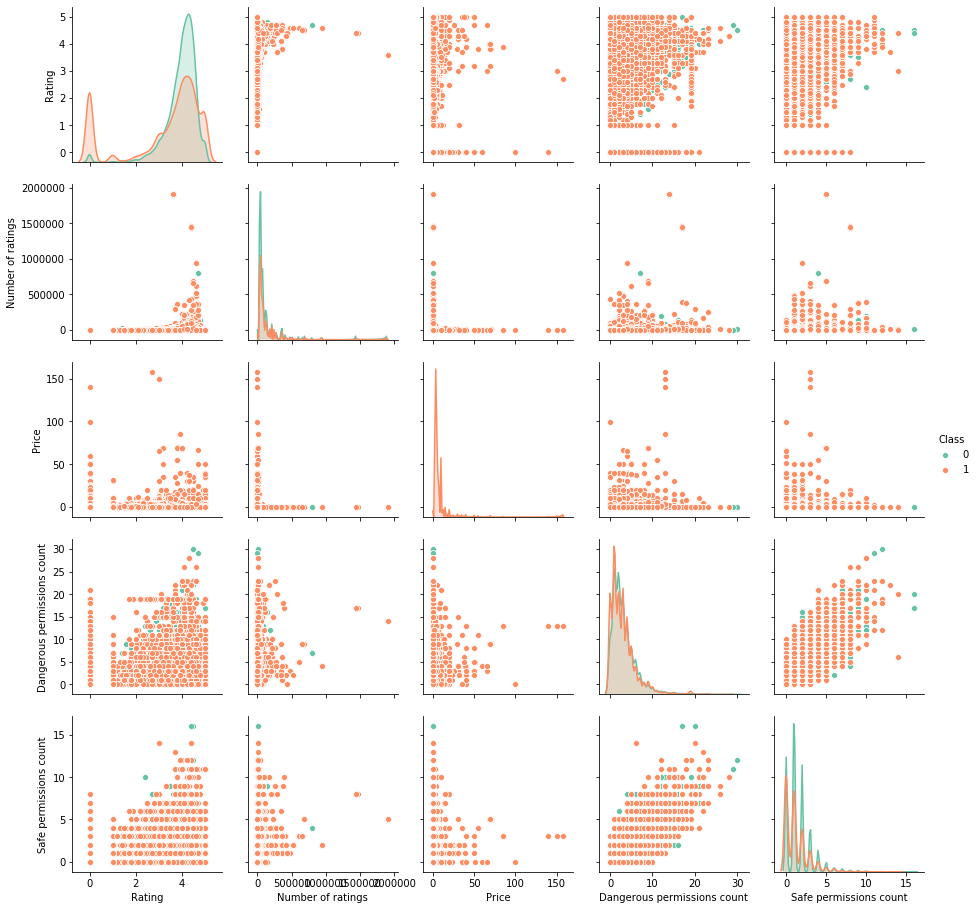

In [19]:
Rating = df['Rating']
N_Ratings = df['Number of ratings']
Price = df['Price']
DPC = df['Dangerous permissions count']
SPC = df['Safe permissions count']
Class = df['Class']
plotgraph = sns.pairplot(pd.DataFrame(list(zip(Rating, N_Ratings, Price, DPC, SPC, Class)), 
                        columns=['Rating', 'Number of ratings', 'Price', 'Dangerous permissions count', 'Safe permissions count', 'Class']), 
                        hue='Class', palette="Set2")

In [20]:
unique_numeric_col_wc = pd.DataFrame(list(zip(Rating, N_Ratings, Price, DPC, SPC, Class)), 
                        columns=['Rating', 'Number of ratings', 'Price', 'Dangerous permissions count', 'Safe permissions count', 'Class'])

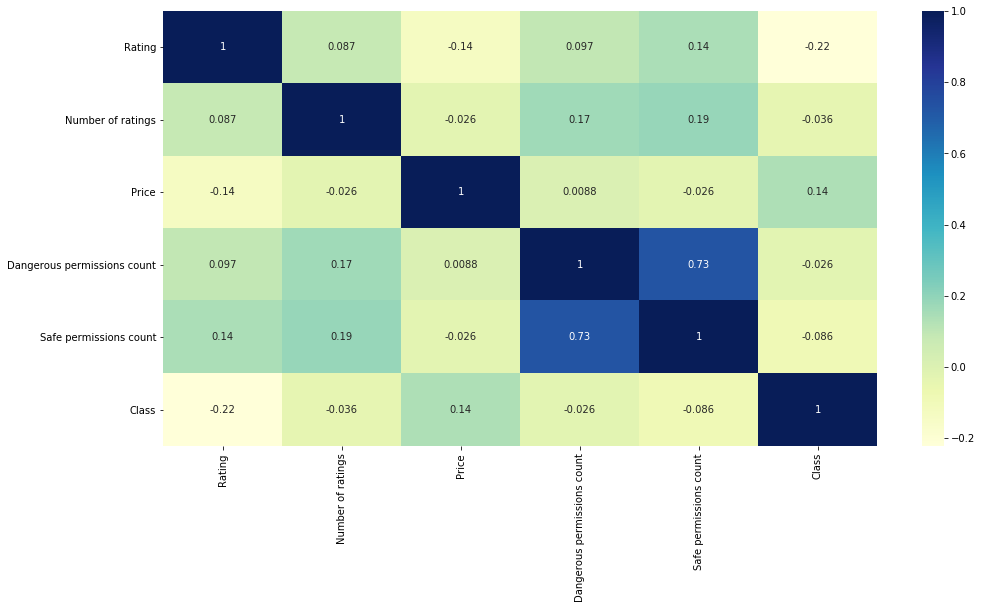

In [21]:
plt.figure(figsize=(16,8))
p = sns.heatmap(unique_numeric_col_wc.corr(), annot=True, cmap="YlGnBu")

In [22]:
# calculate mean
mean = np.nanmean(df['Dangerous permissions count'].unique())
mean

13.892857142857142

In [23]:
g1 = go.Box(
    y=(df['Dangerous permissions count'][df.Class==0]),
    name = 'Benign',
    marker = dict(
        color = 'rgb(0,150,0)',
    )
)
g2 = go.Box(
    y=(df['Dangerous permissions count'][df.Class==1]),
    name = 'Malware',
    marker = dict(
        color = 'rgb(150,0,0)',
    )
)

layout = go.Layout(
    title = "Dangerous Permissions Count",
    yaxis= {'title': 'Dangerous Permissions Count'}
)
data = [g1, g2]
plotly.offline.iplot({'data': data, 'layout': layout})

In [24]:
g1 = go.Box(
    y=(df['Safe permissions count'][df.Class==0]),
    name = 'Benign',
    marker = dict(
        color = 'rgb(0,150,0)',
    )
)
g2 = go.Box(
    y=(df['Safe permissions count'][df.Class==1]),
    name = 'Malware',
    marker = dict(
        color = 'rgb(150,0,0)',
    )
)

layout = go.Layout(
    title = "Safe Permissions Count",
    yaxis= {'title': 'Safe Permissions Count'}
)
data = [g1, g2]
plotly.offline.iplot({'data': data, 'layout': layout})

In [25]:
g1 = go.Box(
    y=(df['Rating'][df.Class==0]),
    name = 'Benign',
    marker = dict(
        color = 'rgb(0,150,0)',
    )
)
g2 = go.Box(
    y=(df['Rating'][df.Class==1]),
    name = 'Malware',
    marker = dict(
        color = 'rgb(150,0,0)',
    )
)
layout = go.Layout(
    title = "Rating vs Class",
    yaxis= {'title': 'Ratings'}
)
data = [g1, g2]
plotly.offline.iplot({'data': data, 'layout': layout})
print("Mean Rating of Benign Class: " + str(df['Rating'][df.Class==0].mean()))
print("Mean Rating of Malware Class: " + str(df['Rating'][df.Class==1].mean()))

Mean Rating of Benign Class: 3.984508450845067
Mean Rating of Malware Class: 3.31359


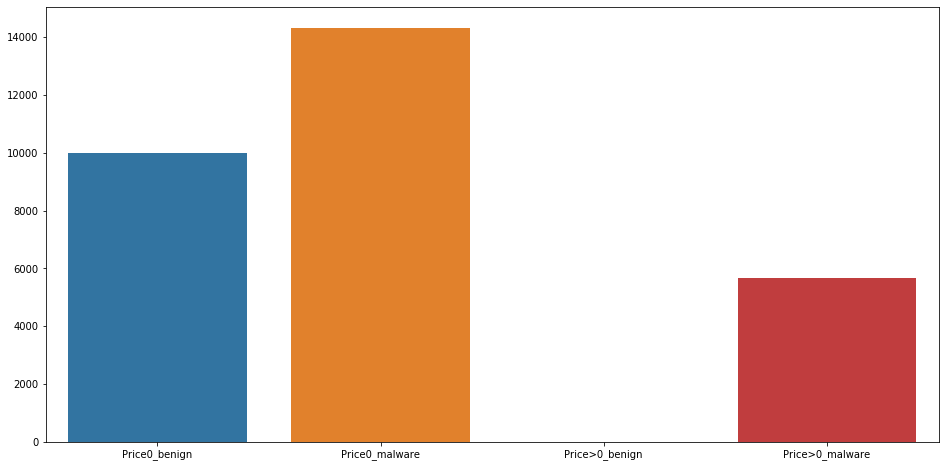

In [26]:
d = {'Price0_benign': [len(df[(df['Price']==0) & (df['Class']==0)])], 
     'Price0_malware': [len(df[(df['Price']==0) & (df['Class']==1)])],
     'Price>0_benign': [len(df[(df['Price']>0) & (df['Class']==0)])],
     'Price>0_malware': [len(df[(df['Price']>0) & (df['Class']==1)])]}

price_cls = pd.DataFrame(data=d)
plt.figure(figsize=(16,8))
sns.barplot(data=price_cls)

In [27]:
cat_benign = df.groupby('Category')['Class'].apply(lambda x: (x==0).sum()).reset_index(name='Benign').sort_values('Benign', ascending=False)


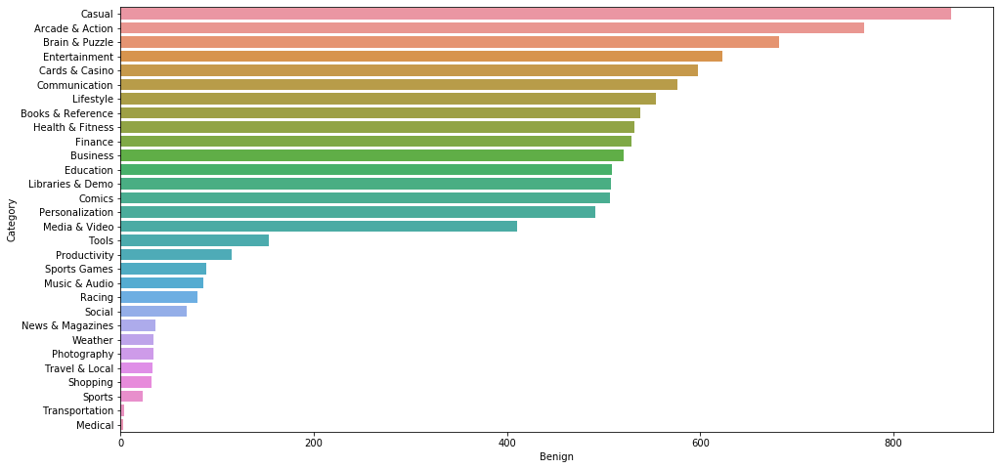

In [28]:
plt.figure(figsize=(16,8))
sns.barplot(y="Category", x="Benign", data=cat_benign)

In [29]:
cat_malware = df.groupby('Category')['Class'].apply(lambda x: (x==1).sum()).reset_index(name='Malware').sort_values('Malware', ascending=False)

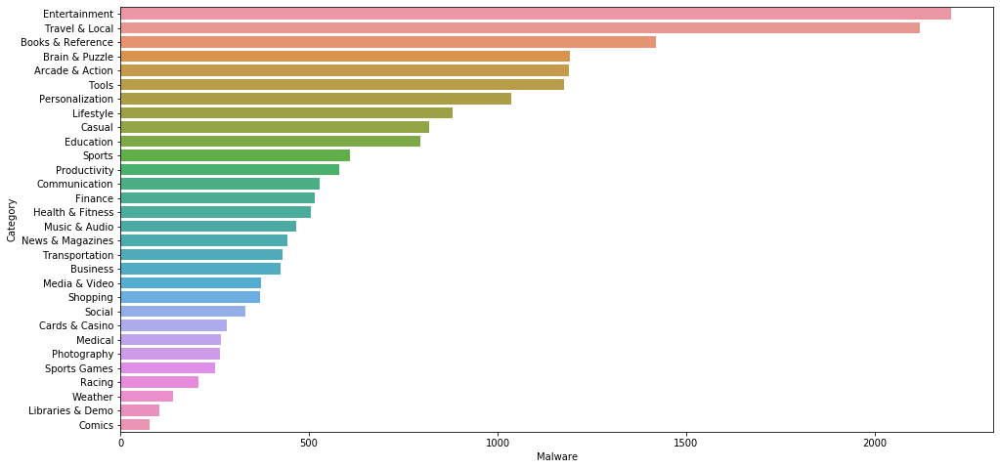

In [30]:
plt.figure(figsize=(16,8))
sns.barplot(y="Category", x="Malware", data=cat_malware)

In [31]:
cat_all = pd.concat([cat_malware, cat_benign['Benign']], axis=1)

In [32]:
t1 = go.Bar(
    y= cat_all['Malware'],
    x= cat_all['Category'],
    name='Malware',
    marker=dict(color = 'rgb(150,0,0)')
)

t2 = go.Bar(
    y= cat_all['Benign'],
    x= cat_all['Category'],
    name='Benign',
    marker=dict(color = 'rgb(0,150,0)')
)

data = [t1, t2]
layout = go.Layout(
    title = 'Malware/Benign',
    barmode='stack',
    xaxis = {'tickangle': -45},
    yaxis = {'title': 'Malware/Benign'}
)

fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot({'data': data, 'layout': layout})

In [33]:
len(df['Package'].unique())

23485

In [34]:
df.groupby('Package')['Class'].apply(lambda x: (x==0).sum()).reset_index(name='Benign').sort_values('Benign', ascending=False).head(20)

,Package,Benign
9953,com.kiwifruitmobile.sudoku,4
17715,com.wordsmobile.slot,4
12397,com.mw.rouletteroyale,4
6198,com.doodle.candytoss,4
9952,com.kiwifruitmobile.solitaire,4
7223,com.finddifferences.finddifferences,4
2895,com.apostek.SlotMachine,4
6200,com.doodle.restaurant,4
3895,com.bayview.tapfish,4
7514,com.fruits.games,4


In [35]:
df.groupby('Package')['Class'].apply(lambda x: (x==1).sum()).reset_index(name='Malware').sort_values('Malware', ascending=False).head(20)

,Package,Malware
15011,com.shazam.android,8
17438,com.vznavigator.Droid2Global,7
13827,com.poynt.android,7
8033,com.glu.android.skob2_free,7
3660,com.audioguidia.worldexplorer360en,7
8153,com.google.earth,7
17425,com.vznavigator.ADR6300,7
5123,com.com2us.thirdblade.normal.freefull.google.g...,6
9028,com.infonow.bofa,6
17109,com.usefull.phrasestranslate,6


In [36]:
df.columns

Index(['App', 'Package', 'Category', 'Description', 'Rating',
       'Number of ratings', 'Price', 'Related apps',
       'Dangerous permissions count', 'Safe permissions count',
       ...
       'Your personal information : read calendar events (D)',
       'Your personal information : read contact data (D)',
       'Your personal information : read sensitive log data (D)',
       'Your personal information : read user defined dictionary (D)',
       'Your personal information : retrieve system internal state (S)',
       'Your personal information : set alarm in alarm clock (S)',
       'Your personal information : write Browser's history and bookmarks (D)',
       'Your personal information : write contact data (D)',
       'Your personal information : write to user defined dictionary (S)',
       'Class'],
      dtype='object', length=184)

In [37]:
df.head(2)

,App,Package,Category,Description,Rating,Number of ratings,Price,Related apps,Dangerous permissions count,Safe permissions count,...,Your personal information : read calendar events (D),Your personal information : read contact data (D),Your personal information : read sensitive log data (D),Your personal information : read user defined dictionary (D),Your personal information : retrieve system internal state (S),Your personal information : set alarm in alarm clock (S),Your personal information : write Browser's history and bookmarks (D),Your personal information : write contact data (D),Your personal information : write to user defined dictionary (S),Class
0,Canada Post Corporation,com.canadapost.android,Business,Canada Post Mobile App gives you access to som...,3.1,77,0.0,"{com.adaffix.pub.ca.android, com.kevinquan.gas...",7.0,1,...,0,1,0,0,0,0,0,1,0,0
1,Word Farm,com.realcasualgames.words,Brain & Puzzle,Speed and strategy combine in this exciting wo...,4.3,199,0.0,"{air.com.zubawing.FastWordLite, com.joybits.do...",3.0,2,...,0,0,0,0,0,0,0,0,0,0


In [38]:
(df['App'].value_counts().rename('Number of ratings').to_frame()
 .reset_index().rename({'index': 'App'}, axis=1)
 .style.set_properties(subset=['App'], **{'font-weight': 'bold'})
 .background_gradient(subset='Number of ratings'))

In [39]:
from dataprep.eda import *

In [40]:
import seaborn as sns

In [ ]:
sns.catplot(x='App',y='Number of ratings',data=df)